In [1]:
from pathlib import Path

import dotenv
import pytorch_lightning as pl
import torch
from matplotlib import pyplot as plt
from pytorch_lightning.callbacks import ModelCheckpoint, RichProgressBar



In [2]:
from inz.data.data_module import XBDDataModule
from inz.data.event import Event, Tier3
from inz.models.baseline_module import BaselineModule
from inz.models.util import get_loc_cls_weights, get_wandb_logger, show_masks_comparison
from inz.xview2_strong_baseline.legacy.losses import ComboLoss
from inz.xview2_strong_baseline.legacy.zoo.models import Res34_Unet_Double

In [3]:
dotenv.load_dotenv()
RANDOM_SEED = 123
pl.seed_everything(RANDOM_SEED)
device = torch.device("cuda")
torch.set_float32_matmul_precision("high")

Seed set to 123


In [4]:
dm = XBDDataModule(
    path=Path("data/xBD_processed"),
    drop_unclassified_channel=True,
    events={
        # Tier1: [
        #     Event.hurricane_florence,
        #     Event.hurricane_harvey,
        #     Event.hurricane_matthew,
        #     Event.hurricane_michael,
        # ],
        Tier3: [
            Event.joplin_tornado,
            #     # Event.moore_tornado,
            #     # Event.tuscaloosa_tornado
        ],
        # Hold: [
        #     Event.hurricane_florence,
        #     Event.hurricane_harvey,
        #     Event.hurricane_matthew,
        #     Event.hurricane_michael,
        # ],
        # Test: [
        #     Event.hurricane_florence,
        #     Event.hurricane_harvey,
        #     Event.hurricane_matthew,
        #     Event.hurricane_michael,
        # ],
    },
    val_fraction=0.15,
    test_fraction=0.0,
    train_batch_size=24,
    val_batch_size=24,
    test_batch_size=24,
    # split_events={
    #     "train": {
    #         Tier1: [
    #             # Event.hurricane_florence,
    #             # Event.hurricane_harvey,
    #             # Event.hurricane_matthew,
    #             # Event.hurricane_michael,
    #         ],
    #         Tier3: [
    #             Event.joplin_tornado,
    #             Event.moore_tornado,
    #             Event.tuscaloosa_tornado
    #         ],
    #     },
    #     "val": {
    #         Hold: [
    #             # Event.hurricane_florence,
    #             # Event.hurricane_harvey,
    #             Event.hurricane_matthew,
    #             # Event.hurricane_michael,
    #         ],
    #         Test: [
    #             # Event.hurricane_florence,
    #             # Event.hurricane_harvey,
    #             Event.hurricane_matthew,
    #             # Event.hurricane_michael,
    #         ],
    #     },
    # },
)
dm.prepare_data()
dm.setup("fit")

print(f"{len(dm.train_dataloader())} train batches, {len(dm.val_dataloader())} val batches")

85 train batches, 15 val batches


In [5]:
loc_weights, cls_weights = get_loc_cls_weights(dataloader=dm.train_dataloader(), device=device, drop_unclassified_class=True)

print(f"Localization weights: {loc_weights}\nClassification weights: {cls_weights}")

100%|██████████| 85/85 [00:19<00:00,  4.41it/s]


Localization weights: tensor([0.1052, 0.8948], device='cuda:0')
Classification weights: tensor([0.0048, 0.0733, 0.2667, 0.4223, 0.2328], device='cuda:0')


In [6]:
model = BaselineModule(
        model=Res34_Unet_Double(pretrained=True).to(device),
        loss=ComboLoss(weights={"dice": 1, "focal": 1}).to(device),
        class_weights=cls_weights.to(device)
    ).to(device)

x_pre = torch.rand([16, 3, 256, 256]).to(device)
x_post = torch.rand([16, 3, 256, 256]).to(device)

with torch.no_grad():
    out = model(torch.cat([x_pre, x_post], dim=1))
    assert out.shape == (16, 5, 256, 256), f"Shape is {out.size}"

using weights from ResNet34_Weights.IMAGENET1K_V1


/home/tomek/inz/inz/.venv/lib/python3.11/site-packages/pytorch_lightning/utilities/parsing.py:199: Attribute 'model' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['model'])`.
/home/tomek/inz/inz/.venv/lib/python3.11/site-packages/pytorch_lightning/utilities/parsing.py:199: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.


In [7]:
wandb_logger = get_wandb_logger()

trainer = pl.Trainer(
    max_epochs=5,
    callbacks=[
        RichProgressBar(),
        ModelCheckpoint(
            dirpath="checkpoints",
            save_last="link"
        )
    ],
    precision="bf16",
    logger=wandb_logger,
)
trainer.fit(model, datamodule=dm)

wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: tomasz-owienko-stud (tomasz-owienko-stud-warsaw-university-of-technology). Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /home/tomek/.netrc


wandb: logging graph, to disable use `wandb.watch(log_graph=False)`
/home/tomek/inz/inz/.venv/lib/python3.11/site-packages/lightning_fabric/connector.py:563: `precision=bf16` is supported for historical reasons but its usage is discouraged. Please set your precision to bf16-mixed instead!
Using bfloat16 Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/tomek/inz/inz/.venv/lib/python3.11/site-packages/pytorch_lightning/utilities/parsing.py:44: attribute 'model' removed from hparams because it cannot be pickled
/home/tomek/inz/inz/.venv/lib/python3.11/site-packages/pytorch_lightning/utilities/parsing.py:44: attribute 'loss' removed from hparams because it cannot be pickled
/home/tomek/inz/inz/.venv/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory /home/tomek/inz/inz/checkpoints exists and is not e

┏━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓
┃    ┃ Name                ┃ Type                ┃ Params ┃
┡━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩
│ 0  │ model               │ Res34_Unet_Double   │ 25.7 M │
│ 1  │ loss_fn             │ ComboLoss           │      0 │
│ 2  │ accuracy_loc        │ BinaryAccuracy      │      0 │
│ 3  │ iou_loc             │ MeanIoU             │      0 │
│ 4  │ f1                  │ MulticlassF1Score   │      0 │
│ 5  │ precision           │ MulticlassPrecision │      0 │
│ 6  │ recall              │ MulticlassRecall    │      0 │
│ 7  │ iou                 │ MeanIoU             │      0 │
│ 8  │ f1_per_class        │ MulticlassF1Score   │      0 │
│ 9  │ precision_per_class │ MulticlassPrecision │      0 │
│ 10 │ recall_per_class    │ MulticlassRecall    │      0 │
│ 11 │ iou_per_class       │ MeanIoU             │      0 │
└────┴─────────────────────┴─────────────────────┴────────┘

Trainable params: 25.7 M                                                                                           
Non-trainable params: 0                                                                                            
Total params: 25.7 M                                                                                               
Total estimated model params size (MB): 102

Output()

`Trainer.fit` stopped: `max_epochs=5` reached.


In [8]:
model.eval()

BaselineModule(
  (model): Res34_Unet_Double(
    (conv6): ConvRelu(
      (layer): Sequential(
        (0): Conv2d(512, 320, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU(inplace=True)
      )
    )
    (conv6_2): ConvRelu(
      (layer): Sequential(
        (0): Conv2d(576, 320, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU(inplace=True)
      )
    )
    (conv7): ConvRelu(
      (layer): Sequential(
        (0): Conv2d(320, 160, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU(inplace=True)
      )
    )
    (conv7_2): ConvRelu(
      (layer): Sequential(
        (0): Conv2d(288, 160, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU(inplace=True)
      )
    )
    (conv8): ConvRelu(
      (layer): Sequential(
        (0): Conv2d(160, 96, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU(inplace=True)
      )
    )
    (conv8_2): ConvRelu(
      (layer): Sequential(
        (0): C

In [9]:
it = iter(dm.val_dataloader())
batch = next(it)
images_pre, masks_pre, images_post, masks_post = batch
with torch.no_grad():
    m = model.to(device)
    preds = m(torch.cat([images_pre, images_post], dim=1).to(device))

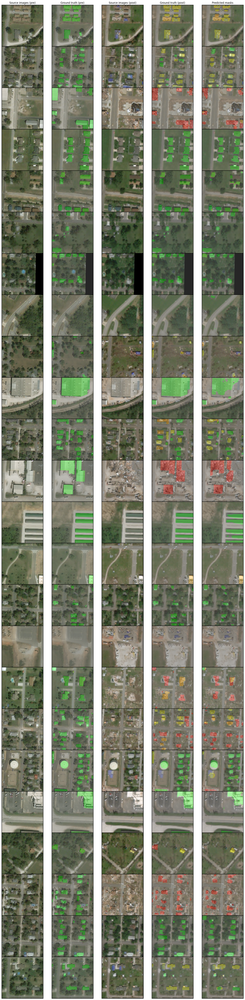

In [10]:
plt.rcParams["savefig.bbox"] = "tight"
plt.rcParams["figure.figsize"] = [20, 120]

show_masks_comparison(
    images_pre=images_pre, images_post=images_post, masks_pre=masks_pre, masks_post=masks_post, preds=preds, opacity=0.3
)